In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import networkx as nx
from functools import partial
import geopandas as gpd
from shapely.geometry import Point, LineString
from multiprocessing import Pool
import shapely.speedups
import geopandas
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import plotly_express as px
import datetime
import plotly.graph_objects as go
import mplleaflet
sns.set()
shapely.speedups.enable()

In [2]:
df = pd.read_csv("/home1/07470/mduarte/Notebooks/ATX/03/02.csv.gz")

In [3]:
df.isna().sum()

Unnamed: 0                   0
Unnamed: 0.1                 0
advertiser_id                0
platform                     0
location_at                  0
latitude                     0
longitude                    0
altitude                   251
horizontal_accuracy          0
vertical_accuracy          251
heading                 431433
speed                      115
ipv_4                   447537
ipv_6                   509715
final_country                0
user_agent                 101
background              431372
publisher_id                 0
wifi_ssid               520034
wifi_bssid              545987
tech_signals           1145275
carrier                 458957
device_model               967
venue_name              851581
venue_category          851619
dwell_time              988056
dtype: int64

In [4]:
df = df.drop(['Unnamed: 0', 'tech_signals', 'speed', 'ipv_4', 'ipv_6', 'wifi_ssid', 'wifi_bssid', 'Unnamed: 0.1'], axis = 1)

In [5]:
nan = df

In [6]:
df = df.dropna(subset=['venue_name', 'venue_category','dwell_time'])

In [7]:
time= df['dwell_time'][df['dwell_time'] >= 14400000]

<AxesSubplot:>

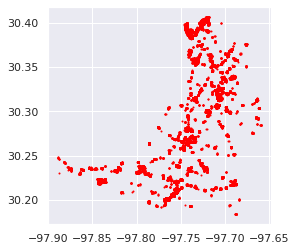

In [8]:
devicedata = gpd.GeoDataFrame(df)
devicedata['geometry'] = pd.Series(devicedata[['longitude','latitude']].values.tolist()).apply(Point)
devicedata.plot(color='red',markersize=1)

In [9]:
px.scatter_mapbox(data_frame = df,lat=df.latitude, lon=df.longitude, mapbox_style='stamen-terrain')

In [10]:
gkk = df.groupby(['venue_name', 'advertiser_id']) 

In [11]:
work =df.groupby(["venue_name", time])["advertiser_id"].count()
work

venue_name                      dwell_time
7-eleven                        14448000.0     15
                                17367000.0     15
                                18951000.0     37
                                23336000.0     33
                                29719000.0     62
                                72099000.0    159
aamco-transmissions             24524000.0    139
academy-sports                  14404000.0     23
advance-auto                    15893000.0     37
                                30195000.0     51
alamo-drafthouse                16157000.0     43
aloft                           31196000.0     47
                                32950000.0     43
                                43592000.0    143
america-best-value              19303000.0    104
                                29853000.0     63
applebees                       26526000.0     72
                                31138000.0      1
automotive-service-association  14702000.0     26
       

In [12]:
test = df.groupby(["venue_name", time])

In [13]:
test.get_group(('walmart',33070000.0))

,advertiser_id,platform,location_at,latitude,longitude,altitude,horizontal_accuracy,vertical_accuracy,heading,final_country,user_agent,background,publisher_id,carrier,device_model,venue_name,venue_category,dwell_time,geometry
185052,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583149636,30.355589,-97.734389,188.100006,28.8,-1.0,0.0,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,walmart,Supermarkets and Groceries;Wholesale and Wareh...,33070000.0,None
195404,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583164317,30.355669,-97.734716,188.000000,60.7,-1.0,0.0,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,walmart,Supermarkets and Groceries;Wholesale and Wareh...,33070000.0,None
574065,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583169017,30.355874,-97.735003,188.000000,28.3,-1.0,0.0,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,walmart,Supermarkets and Groceries;Wholesale and Wareh...,33070000.0,None
614987,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583157625,30.355830,-97.735001,188.000000,31.5,-1.0,0.0,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,walmart,Supermarkets and Groceries;Wholesale and Wareh...,33070000.0,None
708514,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583158256,30.355462,-97.735184,188.100006,26.1,-1.0,0.0,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,walmart,Supermarkets and Groceries;Wholesale and Wareh...,33070000.0,None
751281,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583173139,30.355592,-97.734417,188.100006,28.0,-1.0,0.0,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,walmart,Supermarkets and Groceries;Wholesale and Wareh...,33070000.0,None
841197,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583167795,30.355739,-97.735009,188.000000,41.4,-1.0,0.0,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,walmart,Supermarkets and Groceries;Wholesale and Wareh...,33070000.0,None
937881,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583145238,30.355594,-97.734556,188.100006,40.8,-1.0,0.0,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,walmart,Supermarkets and Groceries;Wholesale and Wareh...,33070000.0,None
949583,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583164001,30.355730,-97.734717,188.000000,61.0,-1.0,0.0,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,walmart,Supermarkets and Groceries;Wholesale and Wareh...,33070000.0,None
1010209,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583143383,30.355584,-97.734366,188.100006,28.4,-1.0,0.0,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,walmart,Supermarkets and Groceries;Wholesale and Wareh...,33070000.0,None


In [14]:
nnan= nan.groupby("advertiser_id")
nnan.get_group("77O207R025N69S253NO98S2NQ20QR01S")

,advertiser_id,platform,location_at,latitude,longitude,altitude,horizontal_accuracy,vertical_accuracy,heading,final_country,user_agent,background,publisher_id,carrier,device_model,venue_name,venue_category,dwell_time
27750,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583159379,30.355674,-97.734045,188.700012,64.3,-1.0,0.000000,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,malls-shopping-centers,Retail;Shopping Centers and Malls,33070000.0
37980,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583116690,30.265014,-97.738367,0.000000,17.8,-1.0,0.000000,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,hilton-us,Travel;Lodging;Upscale Hotels,10497000.0
39182,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583119016,30.368491,-97.680916,195.700012,42.9,-1.0,10.676182,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,NaN,NaN,NaN
56425,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583170617,30.355513,-97.734170,188.100006,28.2,-1.0,0.000000,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,malls-shopping-centers,Retail;Shopping Centers and Malls,33070000.0
70788,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583159947,30.355618,-97.734151,188.800003,34.8,-1.0,0.000000,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,malls-shopping-centers,Retail;Shopping Centers and Malls,33070000.0
98594,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583118164,30.265215,-97.737972,129.400009,30.0,-1.0,148.982970,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,hilton-us,Travel;Lodging;Upscale Hotels,10497000.0
105413,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583108364,30.265133,-97.737973,0.000000,98.4,-1.0,0.000000,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,hilton-us,Travel;Lodging;Upscale Hotels,10497000.0
123866,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583152560,30.355253,-97.734561,188.100006,35.3,-1.0,0.000000,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,malls-shopping-centers,Retail;Shopping Centers and Malls,33070000.0
126199,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583142255,30.390882,-97.716136,206.800003,100.0,-1.0,0.000000,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,NaN,NaN,NaN
131926,77O207R025N69S253NO98S2NQ20QR01S,AAID,1583172498,30.355646,-97.734305,188.100006,100.0,-1.0,0.000000,US,Mozilla/5.0 (Linux; Android 7.0; SM-G920T1 Bui...,1.0,151e0297a27d4140ad9c5d4e4bafd290,Metro by T-Mobile,SM-G920T1,malls-shopping-centers,Retail;Shopping Centers and Malls,33070000.0


In [ ]:
h = pd.DataFrame({ 'names':['H/jw-marriott','fedex', 'H/hilton-us', 'walmart','H/', 'state-farm'  ]
                   'long':[-97.743094,-97.743413,-97.738367, -97.734716, -97.743526,-97.746211], 
                   'lat': [30.264505, 30.264423,30.265014, 30.355669, 30.270456, 30.255959],
                   })

In [24]:
nnan.get_group("2P4464O1QQ5891NPNP129479894462N3")

,advertiser_id,platform,location_at,latitude,longitude,altitude,horizontal_accuracy,vertical_accuracy,heading,final_country,user_agent,background,publisher_id,carrier,device_model,venue_name,venue_category,dwell_time
10001,2P4464O1QQ5891NPNP129479894462N3,AAID,1583135196,30.270456,-97.743526,0.000000,24.7,-1.000000,0.00000,US,Mozilla/5.0 (Linux; Android 9; SM-G960U Build/...,1.0,8bf1745973f14b649f260fca6717d144,AT&T,SM-G960U,NaN,NaN,NaN
20085,2P4464O1QQ5891NPNP129479894462N3,AAID,1583154087,30.270417,-97.743591,142.400009,30.4,13.300003,0.00000,US,Mozilla/5.0 (Linux; Android 9; SM-G960U Build/...,1.0,8bf1745973f14b649f260fca6717d144,AT&T,SM-G960U,NaN,NaN,NaN
22618,2P4464O1QQ5891NPNP129479894462N3,AAID,1583139739,30.270446,-97.743530,142.400009,28.4,7.800003,0.00000,US,Mozilla/5.0 (Linux; Android 9; SM-G960U Build/...,1.0,8bf1745973f14b649f260fca6717d144,AT&T,SM-G960U,NaN,NaN,NaN
45367,2P4464O1QQ5891NPNP129479894462N3,AAID,1583132397,30.270453,-97.743527,141.900009,27.1,9.500000,0.00000,US,Mozilla/5.0 (Linux; Android 9; SM-G960U Build/...,1.0,8bf1745973f14b649f260fca6717d144,AT&T,SM-G960U,NaN,NaN,NaN
53575,2P4464O1QQ5891NPNP129479894462N3,AAID,1583128123,30.270450,-97.743528,142.400009,29.2,15.000000,0.00000,US,Mozilla/5.0 (Linux; Android 9; SM-G960U Build/...,1.0,8bf1745973f14b649f260fca6717d144,AT&T,SM-G960U,NaN,NaN,NaN
55395,2P4464O1QQ5891NPNP129479894462N3,AAID,1583117311,30.255959,-97.746211,0.000000,17.8,-1.000000,0.00000,US,Mozilla/5.0 (Linux; Android 9; SM-G960U Build/...,1.0,8bf1745973f14b649f260fca6717d144,AT&T,SM-G960U,state-farm,Businesses and Services;Insurance,4369000.0
61190,2P4464O1QQ5891NPNP129479894462N3,AAID,1583130274,30.270440,-97.743519,0.000000,18.0,-1.000000,0.00000,US,Mozilla/5.0 (Linux; Android 9; SM-G960U Build/...,1.0,8bf1745973f14b649f260fca6717d144,AT&T,SM-G960U,NaN,NaN,NaN
92246,2P4464O1QQ5891NPNP129479894462N3,AAID,1583174616,30.269491,-97.741181,159.800003,20.7,4.800003,316.11530,US,Mozilla/5.0 (Linux; Android 9; SM-G960U Build/...,1.0,8bf1745973f14b649f260fca6717d144,AT&T,SM-G960U,NaN,NaN,NaN
97213,2P4464O1QQ5891NPNP129479894462N3,AAID,1583138007,30.270441,-97.743566,141.700012,28.2,10.300003,0.00000,US,Mozilla/5.0 (Linux; Android 9; SM-G960U Build/...,1.0,8bf1745973f14b649f260fca6717d144,AT&T,SM-G960U,NaN,NaN,NaN
102011,2P4464O1QQ5891NPNP129479894462N3,AAID,1583122526,30.270426,-97.743553,143.100006,28.5,9.800003,0.00000,US,Mozilla/5.0 (Linux; Android 9; SM-G960U Build/...,1.0,8bf1745973f14b649f260fca6717d144,AT&T,SM-G960U,NaN,NaN,NaN


In [28]:
nnan.get_group("N82PO4S2S5Q6977SO407S4OSP86811P8")

,advertiser_id,platform,location_at,latitude,longitude,altitude,horizontal_accuracy,vertical_accuracy,heading,final_country,user_agent,background,publisher_id,carrier,device_model,venue_name,venue_category,dwell_time
5331,N82PO4S2S5Q6977SO407S4OSP86811P8,AAID,1583180839,30.201584,-97.766190,160.200012,46.1,2.000000,340.469420,US,Mozilla/5.0 (Linux; Android 10; SM-N960U Build...,1.0,d698faf897024858b90831059557ec4f,Verizon,SM-N960U,lowes,Retail;Home Improvement;Hardware Stores,36168000.0
12968,N82PO4S2S5Q6977SO407S4OSP86811P8,AAID,1583193299,30.263579,-97.735351,112.799995,3.2,2.000000,16.997698,US,Mozilla/5.0 (Linux; Android 10; SM-N960U Build...,1.0,d698faf897024858b90831059557ec4f,Verizon,SM-N960U,NaN,NaN,NaN
17902,N82PO4S2S5Q6977SO407S4OSP86811P8,AAID,1583165230,30.201608,-97.766249,160.200012,30.3,2.000000,0.000000,US,Mozilla/5.0 (Linux; Android 10; SM-N960U Build...,1.0,d698faf897024858b90831059557ec4f,Verizon,SM-N960U,lowes,Retail;Home Improvement;Hardware Stores,36168000.0
33770,N82PO4S2S5Q6977SO407S4OSP86811P8,AAID,1583172289,30.201574,-97.766015,160.200012,53.6,2.000000,193.000000,US,Mozilla/5.0 (Linux; Android 10; SM-N960U Build...,1.0,d698faf897024858b90831059557ec4f,Verizon,SM-N960U,lowes,Retail;Home Improvement;Hardware Stores,36168000.0
35656,N82PO4S2S5Q6977SO407S4OSP86811P8,AAID,1583181370,30.201606,-97.766234,160.200012,31.5,2.000000,0.000000,US,Mozilla/5.0 (Linux; Android 10; SM-N960U Build...,1.0,d698faf897024858b90831059557ec4f,Verizon,SM-N960U,lowes,Retail;Home Improvement;Hardware Stores,36168000.0
37420,N82PO4S2S5Q6977SO407S4OSP86811P8,AAID,1583110199,30.201702,-97.766183,160.200012,52.5,2.000000,18.000000,US,Mozilla/5.0 (Linux; Android 10; SM-N960U Build...,1.0,d698faf897024858b90831059557ec4f,Verizon,SM-N960U,lowes,Retail;Home Improvement;Hardware Stores,11988000.0
48609,N82PO4S2S5Q6977SO407S4OSP86811P8,AAID,1583111528,30.201622,-97.766302,160.200012,54.7,2.000000,11.596195,US,Mozilla/5.0 (Linux; Android 10; SM-N960U Build...,1.0,d698faf897024858b90831059557ec4f,Verizon,SM-N960U,lowes,Retail;Home Improvement;Hardware Stores,11988000.0
55297,N82PO4S2S5Q6977SO407S4OSP86811P8,AAID,1583185451,30.201571,-97.766281,160.200012,30.7,2.000000,0.000000,US,Mozilla/5.0 (Linux; Android 10; SM-N960U Build...,1.0,d698faf897024858b90831059557ec4f,Verizon,SM-N960U,lowes,Retail;Home Improvement;Hardware Stores,36168000.0
55873,N82PO4S2S5Q6977SO407S4OSP86811P8,AAID,1583112578,30.201732,-97.766264,160.200012,44.6,2.000000,0.000000,US,Mozilla/5.0 (Linux; Android 10; SM-N960U Build...,1.0,d698faf897024858b90831059557ec4f,Verizon,SM-N960U,lowes,Retail;Home Improvement;Hardware Stores,11988000.0
58050,N82PO4S2S5Q6977SO407S4OSP86811P8,AAID,1583193589,30.281868,-97.727932,149.000000,3.8,2.000000,29.994852,US,Mozilla/5.0 (Linux; Android 10; SM-N960U Build...,1.0,d698faf897024858b90831059557ec4f,Verizon,SM-N960U,NaN,NaN,NaN


In [35]:
timestamp = datetime.datetime.fromtimestamp(1583192998)
print(timestamp.strftime('%Y-%m-%d %H:%M:%S'))

2020-03-02 17:49:58


# Graph

In [16]:
FG = nx.from_pandas_edgelist(df,source ='venue_name', target ='advertiser_id', edge_attr=True)

In [17]:
clubs = list(df.venue_name[0:50].unique())
clubs

['embassy-suites',
 'malls-shopping-centers',
 'wells-fargo',
 '7-eleven',
 'texaco',
 'taco-bell',
 'hilton-us',
 'regal-entertainment-group',
 'mcdonalds',
 'marriott',
 'hyatt',
 'home-depot',
 'la-quinta-inn',
 'jack-in-the-box',
 'travelers',
 'chevron',
 'h-e-b',
 'shell',
 'usps',
 'costco',
 'walgreens',
 'red-roof-inn',
 'chrysler',
 'brewers-association',
 'walmart']

In [18]:
people = list(df.advertiser_id[0:50].unique())
people

['O9642490N8QO9RQO3P3N3748O12Q5Q0R',
 '44N53773PS3S9SPS406RQP39N8ONSRQ6',
 'O0Q543NQ67R291Q2N6O72S7Q58Q9Q36N',
 '4N034R7N02RQ925032RSPQ139R3866QR',
 '21002095N4129277NR3R7PQ90N404SS6',
 'P26406O7R54O91N9N2NPONN7RR617023',
 '0N7SN22421N591S641P45Q844S2NPN64',
 '0713RO33627S94P5NQ1Q751SQ31RN540',
 'QPN25N31R1R990RS3P6Q1O854290O092',
 '936RS6R720519950NO8S76P46S5P30SO',
 '5PN24041O9O097QOOONP44Q52OQ7QRPN',
 '79SQ5P5POOO1919RN465506489860430',
 'Q6979O8217O49222N97455795NQ05593',
 'S28S7R41OS9291763Q4O98PPQ3RQ244N',
 '171S29Q48N8N958PON640SN2O7O6O360',
 '75RO65N19R0996334PRN89748910P861',
 '2667934NN7PN9O093040Q97NS6907RQO',
 'P844098232S7976QOPS3Q5O6QPNP6273',
 '09S80O1Q72289190N937386Q6R2QQ6O8',
 '6QOS7412Q5Q291O9NRQ2667O0R403S56',
 '2604SR3SQR499P003S520RR177RP0179',
 'S84QRPNNPS1O9117328P92OOR5Q353Q4',
 '7P67393QRP2792QQ309S6P37O0Q44447',
 'Q478S15Q06Q69S073ROR32282R54O2O6',
 '64O856446N8895QQ4Q1PPR280654SN8P',
 'Q2PQ26P1S6P9955P46600830Q6P06114',
 '8NO15NQ6Q3S2987130P76788193420N9',
 

In [19]:
dict(zip(clubs, clubs))

{'embassy-suites': 'embassy-suites',
 'malls-shopping-centers': 'malls-shopping-centers',
 'wells-fargo': 'wells-fargo',
 '7-eleven': '7-eleven',
 'texaco': 'texaco',
 'taco-bell': 'taco-bell',
 'hilton-us': 'hilton-us',
 'regal-entertainment-group': 'regal-entertainment-group',
 'mcdonalds': 'mcdonalds',
 'marriott': 'marriott',
 'hyatt': 'hyatt',
 'home-depot': 'home-depot',
 'la-quinta-inn': 'la-quinta-inn',
 'jack-in-the-box': 'jack-in-the-box',
 'travelers': 'travelers',
 'chevron': 'chevron',
 'h-e-b': 'h-e-b',
 'shell': 'shell',
 'usps': 'usps',
 'costco': 'costco',
 'walgreens': 'walgreens',
 'red-roof-inn': 'red-roof-inn',
 'chrysler': 'chrysler',
 'brewers-association': 'brewers-association',
 'walmart': 'walmart'}

In [20]:
[club for club in clubs]

['embassy-suites',
 'malls-shopping-centers',
 'wells-fargo',
 '7-eleven',
 'texaco',
 'taco-bell',
 'hilton-us',
 'regal-entertainment-group',
 'mcdonalds',
 'marriott',
 'hyatt',
 'home-depot',
 'la-quinta-inn',
 'jack-in-the-box',
 'travelers',
 'chevron',
 'h-e-b',
 'shell',
 'usps',
 'costco',
 'walgreens',
 'red-roof-inn',
 'chrysler',
 'brewers-association',
 'walmart']

In [21]:
[FG.degree(club) for club in clubs]

[65,
 3674,
 163,
 441,
 57,
 141,
 22,
 33,
 407,
 21,
 97,
 197,
 57,
 94,
 116,
 174,
 794,
 343,
 112,
 460,
 165,
 11,
 33,
 47,
 744]

In [22]:
FG = nx.from_pandas_edgelist(df, source ='venue_name', target ='advertiser_id', edge_attr=True) 
layout = nx.spring_layout(FG,iterations=50);

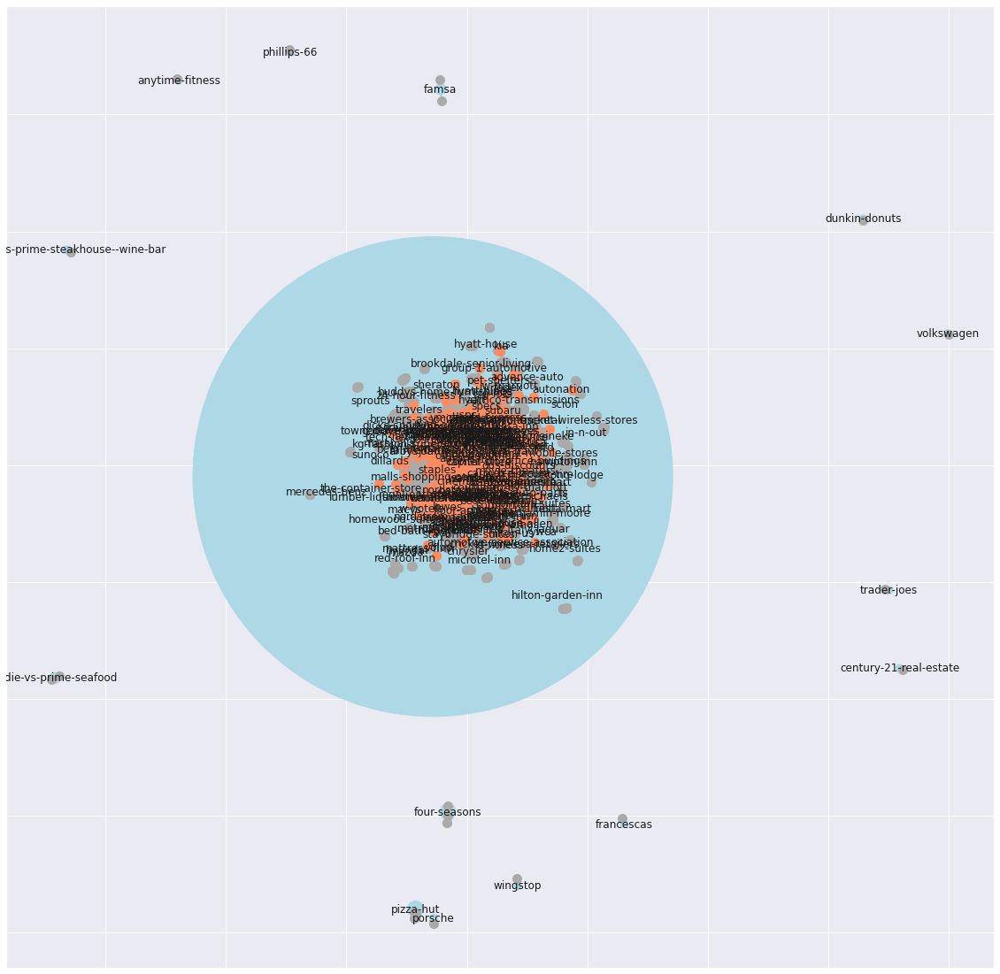

In [23]:
plt.figure(figsize=(20, 20))

# 1. Create the graph
g = nx.from_pandas_edgelist(df, source='venue_name', target='advertiser_id') 

# 2. Create a layout for our nodes 
layout = nx.spring_layout(g,iterations=50)

# 3. Draw the parts we want
nx.draw_networkx_edges(g, layout, edge_color='#AAAAAA')

clubs = [node for node in g.nodes() if node in df.venue_name.unique()]
size = [g.degree(node) * 80 for node in g.nodes() if node in df.venue_name.unique()]
nx.draw_networkx_nodes(g, layout, nodelist=clubs, node_size=size, node_color='lightblue')

people = [node for node in g.nodes() if node in df.advertiser_id.unique()]
nx.draw_networkx_nodes(g, layout, nodelist=people, node_size=100, node_color='#AAAAAA')

high_degree_people = [node for node in g.nodes() if node in df.advertiser_id.unique() and g.degree(node) > 1]
nx.draw_networkx_nodes(g, layout, nodelist=high_degree_people, node_size=100, node_color='#fc8d62')

club_dict = dict(zip(clubs, clubs))
nx.draw_networkx_labels(g, layout, labels=club_dict)

plt.show()